In [1]:
import datetime
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()
%matplotlib inline

def load_data(filename):
    """
    Funzione per il parsing di una serie intraday 
    con estensione txt esportata da Tradestation
    """
    data = pd.read_csv(filename, 
                       usecols=['Date','Time','Open','High','Low','Close','Up','Down'], 
                       parse_dates=[['Date', 'Time']], )
    data.columns = ["date_time","open","high","low","close","up","down"]
    data.set_index('date_time', inplace = True)
    data['volume'] = data['up'] + data['down']
    data.drop(['up','down'], axis=1, inplace=True)
    return data

filename = "@NG_60min_Exchange.txt"
dataset = load_data(filename)
dataset["hour"] = dataset.index.hour
dataset[-39:-16]

,open,high,low,close,volume,hour
date_time,,,,,,
2019-11-07 13:00:00,2.799,2.814,2.753,2.786,32985,13
2019-11-07 14:00:00,2.786,2.797,2.759,2.762,16066,14
2019-11-07 15:00:00,2.761,2.788,2.753,2.783,25531,15
2019-11-07 16:00:00,2.782,2.799,2.780,2.793,3617,16
2019-11-07 17:00:00,2.792,2.796,2.783,2.785,1723,17
2019-11-07 19:00:00,2.792,2.792,2.787,2.790,414,19
2019-11-07 20:00:00,2.790,2.797,2.785,2.785,627,20
2019-11-07 21:00:00,2.785,2.787,2.776,2.786,680,21
2019-11-07 22:00:00,2.787,2.787,2.779,2.781,469,22


In [2]:
dataset.iplot(kind='candle',theme='white',
              up_color='green', down_color='red',
              title = "Copper Continuous Futures [HG]", xTitle = "Tempo", yTitle = "Prezzo")

In [3]:
dataset.tail(200).iplot(kind='candle',theme='white',
                        up_color='green', down_color='red',
                        title = "Copper Continuous Futures [HG]", xTitle = "Tempo", yTitle = "Prezzo")

Filtriamo per esempio tutti i record alle ore 0 e visualizziamo i primi 10:

In [4]:
dataset[(dataset.hour == 0)].volume.head(10)

date_time
2007-01-02     56
2007-01-03      2
2007-01-04     37
2007-01-05    364
2007-01-08     44
2007-01-09     40
2007-01-10     39
2007-01-11     60
2007-01-12     10
2007-01-15     59
Name: volume, dtype: int64

In [5]:
round(dataset[(dataset.hour == 0)].volume.mean(),2)

167.9

In [6]:
dataset[(dataset.hour == 0)].volume.count()

3270

In [7]:
hours = []

for hour in range(0,24):
    hours.append(hour)
    
print(hours)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]


In [8]:
activity = []

for hour in hours:
    activity.append(round(dataset[(dataset.hour == hour)].volume.mean(),2))
    
activity

[167.9,
 235.26,
 205.78,
 305.53,
 447.35,
 399.66,
 479.75,
 796.77,
 1696.23,
 5624.23,
 12979.02,
 13348.25,
 10170.66,
 8558.99,
 7982.77,
 11243.79,
 1847.46,
 737.62,
 nan,
 392.86,
 163.54,
 187.83,
 148.35,
 135.3]

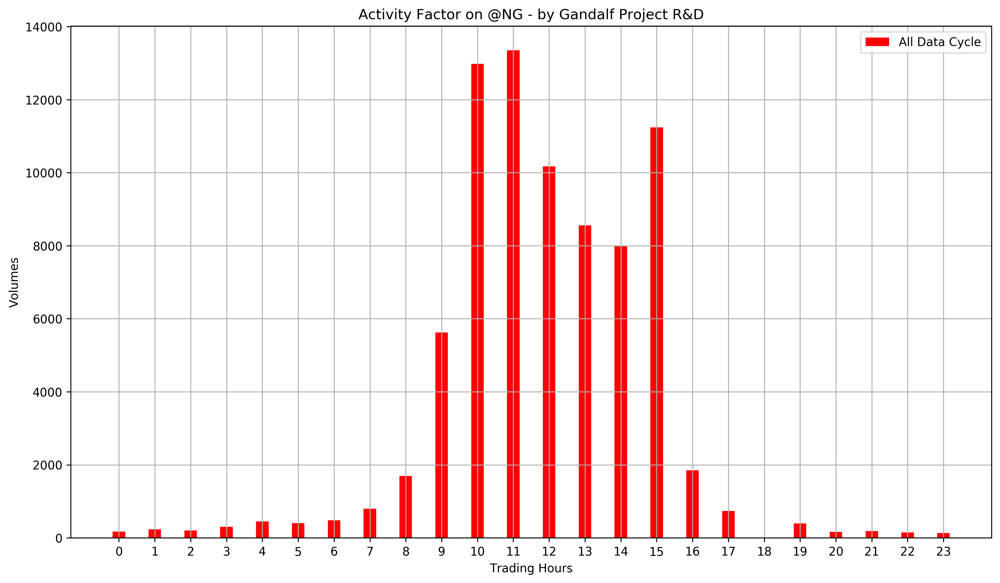

In [9]:
# MODULO GRAFICO **************************************
n_groups = 24

fig, ax = plt.subplots(figsize=(14, 8), dpi=300)

index = np.arange(n_groups)
bar_width = 0.35
opacity = 1

rects1 = ax.bar(index, 
                activity, 
                bar_width,
                alpha=opacity,
                color='red',
                label='All Data Cycle')

ax.set_xlabel('Trading Hours')
ax.set_ylabel('Volumes')
ax.set_title('Activity Factor on ' + filename.split('_')[0] + ' - by Gandalf Project R&D')
ax.set_xticks(index)
ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                     '13','14','15','16','17','18','19','20','21','22','23']))
ax.legend()
ax.grid(True)
plt.show()
# MODULO GRAFICO **************************************

In [10]:
def normalizeMinMax(array):
    """
    Funzione per normalizzare un array
    che porta a 0 il valore minimo
    e ad 1 il valore massimo
    (a[i] - min(a))/(max(a)-min(a)) 
    """
    normalized_array = []
    for elements in array:
        normalized_array.append((elements - min(array))/(max(array)-min(array)))
    return normalized_array

def normalizeMax(array):
    """
    Funzione per normalizzare un array
    che porta ad 1 il valore massimo
    a[i]/max(a)
    """
    normalized_array = []
    for elements in array:
        normalized_array.append(elements / max(array))
    return normalized_array

normalize = True
    
if normalize == True:
    activity = normalizeMax(activity)

activity

[0.012578427883804994,
 0.017624782274830032,
 0.015416253066881427,
 0.022889142771524356,
 0.03351375648493248,
 0.029941003502331767,
 0.035941040960425524,
 0.059690970726499724,
 0.12707508474893714,
 0.4213458693087109,
 0.9723386960837563,
 1.0,
 0.7619470717135205,
 0.6412068997808701,
 0.5980386942108517,
 0.8423418800217257,
 0.13840465978686345,
 0.05525967823497462,
 nan,
 0.02943157342722829,
 0.012251793306238644,
 0.014071507500983276,
 0.011113816417882493,
 0.010136160170808909]

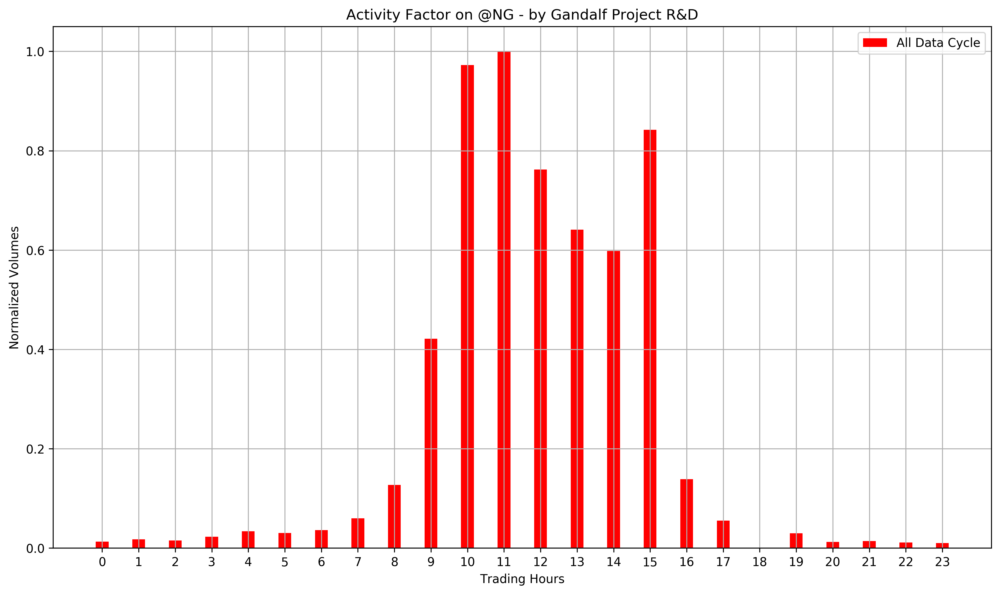

In [11]:
# MODULO GRAFICO **************************************
n_groups = 24

fig, ax = plt.subplots(figsize=(14, 8), dpi=300)

index = np.arange(n_groups)
bar_width = 0.35
opacity = 1

rects1 = ax.bar(index, 
                activity, 
                bar_width,
                alpha=opacity,
                color='red',
                label='All Data Cycle')

ax.set_xlabel('Trading Hours')
if normalize == True:
    ax.set_ylabel('Normalized Volumes')
else:
    ax.set_ylabel('Volumes')
ax.set_title('Activity Factor on ' + filename.split('_')[0] + ' - by Gandalf Project R&D')
ax.set_xticks(index)
ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                     '13','14','15','16','17','18','19','20','21','22','23']))
ax.legend()
ax.grid(True)
plt.show()
# MODULO GRAFICO **************************************

### Ripetendo l'analisi su tre periodi temporali differenti:

In [12]:
dataset = load_data(filename)
dataset["hour"] = dataset.index.hour
dataset.head()

,open,high,low,close,volume,hour
date_time,,,,,,
2007-01-01 19:00:00,17.836,17.873,17.815,17.873,99,19
2007-01-01 20:00:00,17.871,17.871,17.811,17.813,37,20
2007-01-01 21:00:00,17.814,17.838,17.806,17.806,16,21
2007-01-01 22:00:00,17.806,17.841,17.786,17.786,62,22
2007-01-01 23:00:00,17.791,17.801,17.760,17.781,128,23


In [13]:
dataset.index.min()

Timestamp('2007-01-01 19:00:00')

In [14]:
dataset.index.max()

Timestamp('2019-11-11 05:00:00')

In [18]:
#******* INPUT *********************************

filename = "@NG_60min_Exchange.txt"

startDateLong = "20070101"
endDateLong = "20191014"

startDateMid = "20140101"
endDateMid = "20191014"

startDateShort = "20181014"
endDateShort = "20191014"

normalize = True

#******* INPUT *********************************

In [19]:
startDateLongParsed = datetime.date(int(startDateLong[0:4]), int(startDateLong[4:6]), int(startDateLong[6:]))
endDateLongParsed = datetime.date(int(endDateLong[0:4]), int(endDateLong[4:6]), int(endDateLong[6:]))

startDateMidParsed = datetime.date(int(startDateMid[0:4]), int(startDateMid[4:6]), int(startDateMid[6:]))
endDateMidParsed = datetime.date(int(endDateMid[0:4]), int(endDateMid[4:6]), int(endDateMid[6:]))

startDateShortParsed = datetime.date(int(startDateShort[0:4]), int(startDateShort[4:6]), int(startDateShort[6:]))
endDateShortParsed = datetime.date(int(endDateShort[0:4]), int(endDateShort[4:6]), int(endDateShort[6:]))

instrument_Long = dataset.loc[startDateLongParsed:endDateLongParsed]
instrument_Mid = dataset.loc[startDateMidParsed:endDateMidParsed]
instrument_Short = dataset.loc[startDateShortParsed:endDateShortParsed]

activity_long = []
activity_mid = []
activity_short = []

hours = []
for hour in range(0,24):
    hours.append(hour)

for hour in hours:
    activity_long.append(round(instrument_Long[(instrument_Long.hour == hour)].volume.mean(),2))
    activity_mid.append(round(instrument_Mid[(instrument_Mid.hour == hour)].volume.mean(),2))
    activity_short.append(round(instrument_Short[(instrument_Short.hour == hour)].volume.mean(),2))
    
if normalize == True:
    activity_long = normalizeMax(activity_long)
    activity_mid = normalizeMax(activity_mid)
    activity_short = normalizeMax(activity_short)

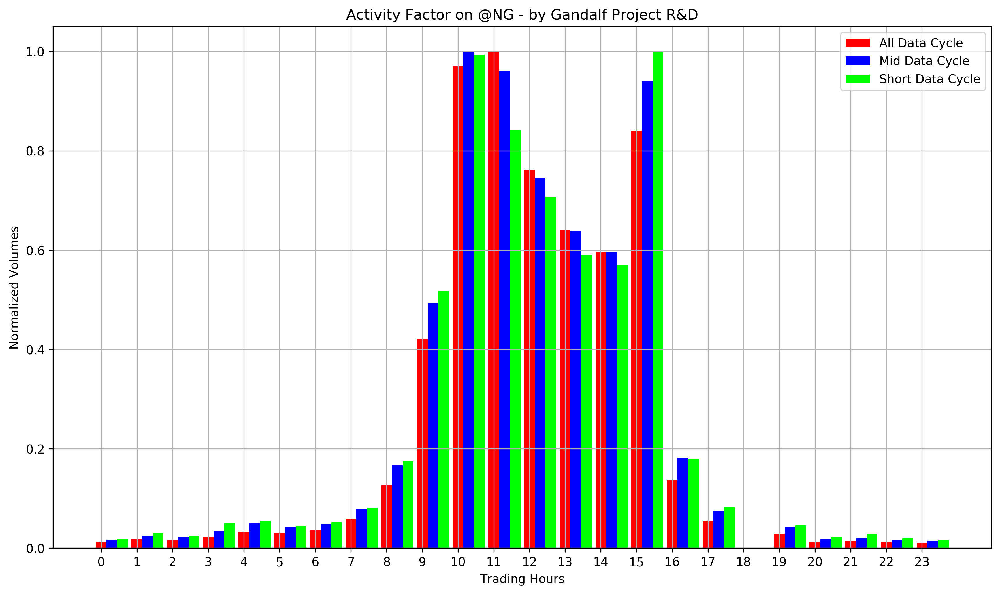

In [20]:
# MODULO GRAFICO **************************************
n_groups = 24
fig, ax = plt.subplots(figsize=(14, 8), dpi=300)
index = np.arange(n_groups)
bar_width = 0.30
opacity = 1

label_all = "All Data Cycle: from " + startDateLong + " to " + endDateLong
label_mid = "Mid Data Cycle: from " + startDateMid + " to " + endDateMid
label_short = "Short Data Cycle: from " + startDateShort + " to " + endDateShort

rects1 = plt.bar(index, 
                 activity_long, 
                 bar_width,
                 alpha=opacity,
                 color='red',
                 label=label_all)
rects2 = plt.bar(index + bar_width, 
                 activity_mid, 
                 bar_width,
                 alpha=opacity,
                 color='blue',
                 label=label_mid)
rects3 = plt.bar(index + 2 * bar_width, 
                 activity_short, 
                 bar_width,
                 alpha=opacity,
                 color='lime',
                 label=label_short)

ax.set_xlabel('Trading Hours')
if normalize == True:
    ax.set_ylabel('Normalized Volumes')
else:
    ax.set_ylabel('Volumes')
ax.set_title('Activity Factor on ' + filename.split('_')[0] + ' - by Gandalf Project R&D')
ax.set_xticks(index)
ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                     '13','14','15','16','17','18','19','20','21','22','23']))
ax.legend()
ax.grid(True)
plt.show()
# MODULO GRAFICO **************************************